In [1]:
import sys
sys.path.insert(0, "../../..")
from paths import DATA_DIR, FIG_DIR

import numpy as np
import pandas as pd
import scanpy as sc
import dynamo as dyn

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from graphvelo.plot import gene_trend
from graphvelo.utils import mack_score
from graphvelo.graph_velocity import GraphVelo

/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
save = True
save_for_pre = False

In [3]:
dyn.configuration.reset_rcParams()
if save_for_pre:
    dyn.configuration.set_figure_params('dynamo', background='black')

In [10]:
adata = sc.read(DATA_DIR / 'scv_velocyto_perturb.h5ad')

In [11]:
selection = ["infected"]
mask = np.in1d(adata.obs['infection_status'], selection)
adata = adata[mask].copy()
adata

AnnData object with n_obs × n_vars = 5001 × 31926
    obs: 'guide_identity', 'number_of_guides', 'guide_read_count', 'guide_UMI_count', 'guide_coverage', 'gem_group', 'CRISPRi_library_element', 'viral_load', 'log_viral_load', 'infection_status', 'cell_cycle_phase', 'leiden_cluster_id', 'umap_coord1', 'umap_coord2'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [12]:
adata.write('SCV_infected_velocyto.h5ad')

In [6]:
viral_genes = adata[:, adata.var_names.str.startswith('SCV')].var_names.values
lenti_genes = adata[:, adata.var_names.str.startswith('lenti')].var_names.values
host_genes = ~pd.Series(adata.var_names).isin(viral_genes.tolist()+lenti_genes.tolist()).values
host_genes = adata.var_names[host_genes]

In [7]:
dyn.pp.recipe_monocle(adata, 
                      genes_use_for_norm=host_genes,
                      genes_to_append=viral_genes.tolist(),
                      genes_to_exclude=lenti_genes.tolist(),
                      n_top_genes=1000,
                      )
dyn.tl.reduceDimension(adata, enforce=True)

|-----? dynamo.preprocessing.deprecated is deprecated.
|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_filtered_genes_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_genes_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----> filtering cells...


/var/folders/zr/17m1_r_x57q5mxr1zs8px9rh0000gn/T/ipykernel_50038/117627992.py:1: DeprecationWarning: recipe_monocle is deprecated and will be removed in a future release. Please update your code to use the new replacement function.
  dyn.pp.recipe_monocle(adata,


|-----> 4999 cells passed basic filters.
|-----> filtering gene...
|-----> 6341 genes passed basic filters.
|-----> calculating size factor...


/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/preprocessing/deprecated.py:650: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[layer + "_Size_Factor"] = sfs


|-----> selecting genes in layer: X, sort method: SVR...
|-----> size factor normalizing the data, followed by log1p transformation.
|-----> Set <adata.X> to normalized data
|-----> applying PCA ...
|-----> <insert> X_pca to obsm in AnnData Object.
|-----> cell cycle scoring...
|-----> computing cell phase...
|-----> [Cell Phase Estimation] completed [38890.9813s]
|-----> [Cell Cycle Scores Estimation] completed [0.2653s]
|-----> [recipe_monocle preprocess] completed [3.8185s]
|-----> retrieve data for non-linear dimension reduction...
|-----> [UMAP] using X_pca with n_pca_components = 30
|-----> <insert> X_umap to obsm in AnnData Object.
|-----> [UMAP] completed [13.5567s]


In [7]:
dyn.tl.dynamics(adata, assumption_mRNA='kinetic')
dyn.tl.cell_velocities(adata, enforce=True)

|-----> dynamics_del_2nd_moments_key is None. Using default value from DynamoAdataConfig: dynamics_del_2nd_moments_key=False
|-----------> removing existing M layers:[]...
|-----------> making adata smooth...
|-----> calculating first/second moments...
|-----> [moments calculation] completed [12.2220s]


estimating gamma: 100%|██████████| 1000/1000 [00:11<00:00, 87.29it/s]


|-----> incomplete neighbor graph info detected: connectivities and distances do not exist in adata.obsp, indices not in adata.uns.neighbors.
|-----> Neighbor graph is broken, recomputing....
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method pynn selected
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 2.0396%

/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/tools/utils.py:2605: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if np.all(vel_params_df.gamma_r2.values is None) or np.all(vel_params_df.gamma_r2.values == ""):


|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%|-----> [calculating transition matrix via pearson kernel with sqrt transform.] completed [4.1674s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%|-----> [projecting velocity vector to low dimensional embedding] completed [0.4402s]
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected


AnnData object with n_obs × n_vars = 5001 × 31926
    obs: 'guide_identity', 'number_of_guides', 'guide_read_count', 'guide_UMI_count', 'guide_coverage', 'gem_group', 'CRISPRi_library_element', 'viral_load', 'log_viral_load', 'infection_status', 'cell_cycle_phase', 'leiden_cluster_id', 'umap_coord1', 'umap_coord2', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'unspliced_Size_Factor', 'Size_Factor', 'initial_spliced_cell_size', 'initial_unspliced_cell_size', 'initial_cell_size', 'spliced_Size_Factor', 'ntr'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'score', 'log_m', 'frac', 'use_for_pca', 'ntr', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_order', 'cell_phase_genes', 'neighbors', 'umap_fit', 'vel_params_names', 'dynamics', 'grid_velocity_umap'
    obsm: 'X_umap', 'X_pca', 'X', 'cell_cycle_scor

|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----------> plotting with basis key=X_umap


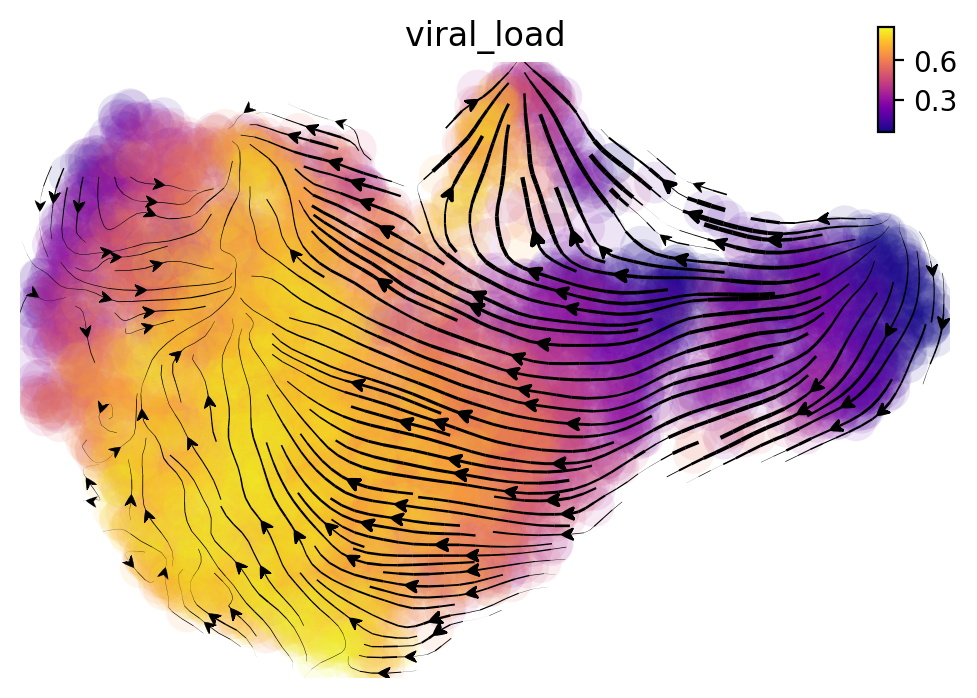

In [9]:
fig_kwargs = {'color': 'viral_load', 'cmap': 'plasma', 'save_show_or_return': 'return'}
if save: save_kwargs = {'dpi': 300, 'fname': str(FIG_DIR)+'/figures_sars_cov_2/dynamo_vf.svg', 'transparent': True}
ax = dyn.pl.streamline_plot(adata, **fig_kwargs)
plt.savefig(**save_kwargs)
plt.show()

In [8]:
adata = adata[:, adata.var['use_for_pca']]

Learning Phi in tangent space projection.: 100%|██████████| 5001/5001 [00:05<00:00, 865.88it/s] 
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/graphvelo/graph_velocity.py:386: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"{key}_params"] = {
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/graphvelo/graph_velocity.py:373: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(T[T>0])


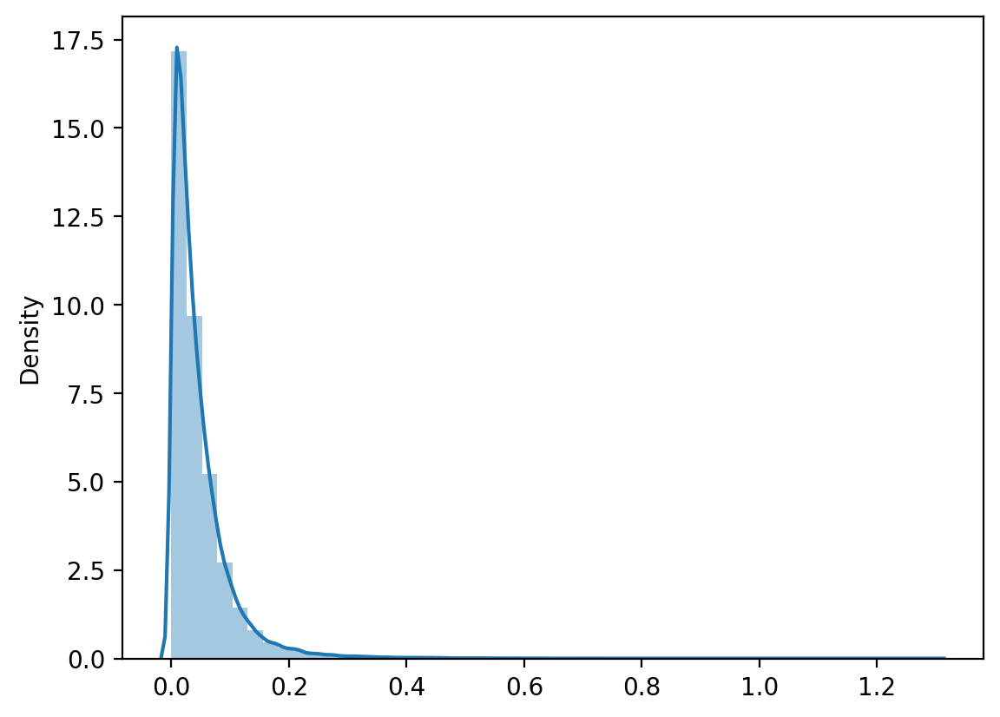

In [9]:
gv = GraphVelo(adata, gene_subset=adata[:, adata.var['use_for_dynamics']].var_names, xkey='M_s', vkey='velocity_S')
gv.train()
gv.write_to_adata(adata)
gv.plot_phi_dist()

In [10]:
adata.layers['velocity_gv'] = gv.project_velocity(adata.layers['M_s'])
adata.obsm['gv_pca'] = gv.project_velocity(adata.obsm['X_pca'])
adata.obsm['gv_umap'] = gv.project_velocity(adata.obsm['X_umap'])

projecting velocity vector to low dimensional embedding:   0%|          | 0/5001 [00:00<?, ?it/s]

projecting velocity vector to low dimensional embedding: 100%|██████████| 5001/5001 [00:02<00:00, 2193.16it/s]
projecting velocity vector to low dimensional embedding: 100%|██████████| 5001/5001 [00:00<00:00, 18171.18it/s]
projecting velocity vector to low dimensional embedding: 100%|██████████| 5001/5001 [00:00<00:00, 17020.27it/s]


|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----------> plotting with basis key=X_umap


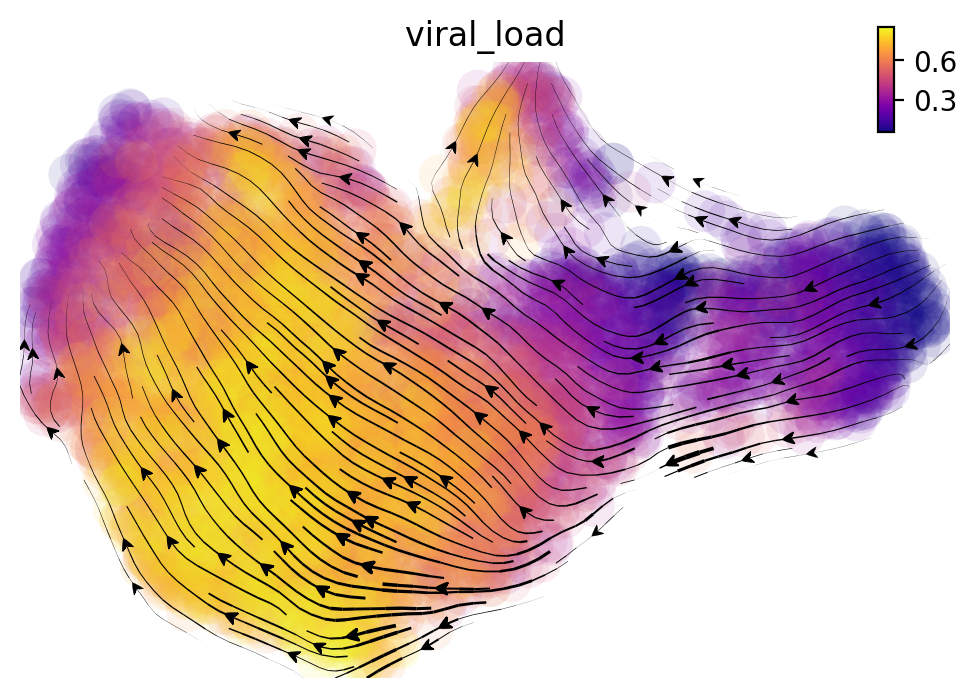

In [14]:
fig_kwargs = {'color': 'viral_load', 'cmap': 'plasma', 'vector': 'gv', 'save_show_or_return': 'return'}
if save: save_kwargs = {'dpi': 300, 'fname': str(FIG_DIR)+'/figures_sars_cov_2/gv_vf.svg', 'transparent': True}
ax = dyn.pl.streamline_plot(adata, **fig_kwargs)
plt.savefig(**save_kwargs)
plt.show()

In [39]:
# check apoptosis activity
import json
with open('KEGG_APOPTOSIS.v2024.1.Hs.json', 'r') as file:
    gene_set_info = json.load(file)
genes = gene_set_info['KEGG_APOPTOSIS']['geneSymbols']

In [40]:
adata.obs['Apoptosis_activity'] = dyn.tl.score_cells(adata, genes=genes)
adata.obs['Apoptosis_velocity'] = dyn.tl.score_cells(adata, genes=genes, layer='velocity_gv')

|-----> method arg is None, choosing methods automatically...
|-----------> method pynn selected
|-----> method arg is None, choosing methods automatically...
|-----------> method pynn selected


|-----------> plotting with basis key=X_umap


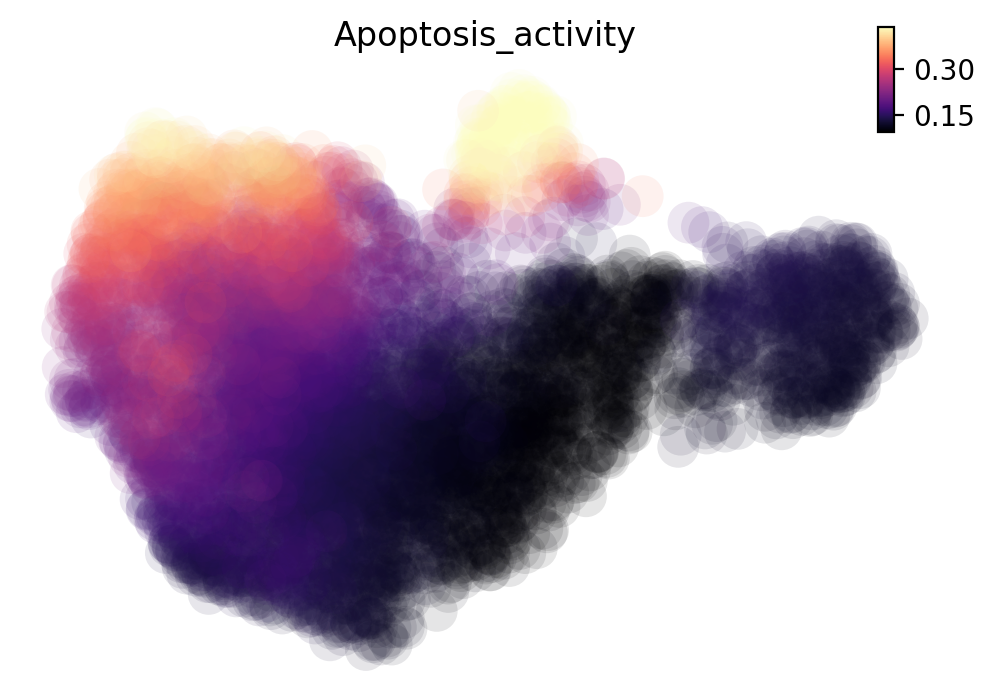

In [ ]:
fig_kwargs = {'color': ['Apoptosis_activity'], 'cmap': 'magma', 'ncols': 1, 'save_show_or_return': 'return'}
if save: save_kwargs = {'dpi': 300, 'fname': str(FIG_DIR)+'/figures_sars_cov_2/apoptosis.pdf', 'transparent': True}
ax = dyn.pl.scatters(adata, **fig_kwargs)
plt.savefig(**save_kwargs)
plt.show()

In [11]:
adata.write('scv_gv.h5ad')

In [4]:
adata = dyn.read('scv_gv.h5ad')

In [ ]:
selected_genes = viral_genes.tolist()+['ISG15','IFNL1','NFKBIA']

|-----------> plotting with basis key=X_umap


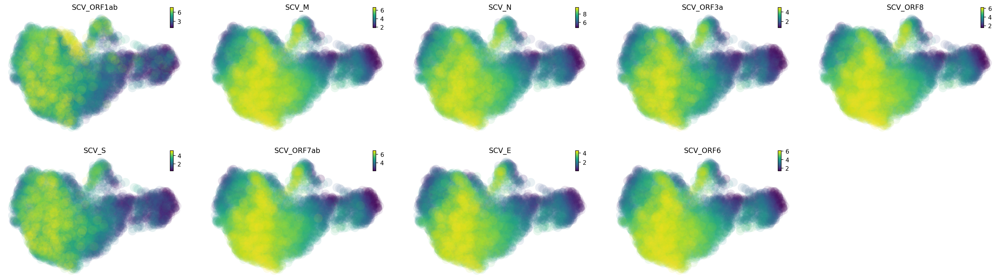

In [7]:
fig_kwargs = {'color': viral_genes, 'cmap': 'viridis', 'ncols': 5, 'save_show_or_return': 'return'}
if save: save_kwargs = {'dpi': 300, 'fname': str(FIG_DIR)+'/figures_sars_cov_2/vgene_expr.pdf', 'transparent': True}
ax = dyn.pl.scatters(adata, **fig_kwargs)
plt.savefig(**save_kwargs)
plt.show()

|-----------> plotting with basis key=X_umap


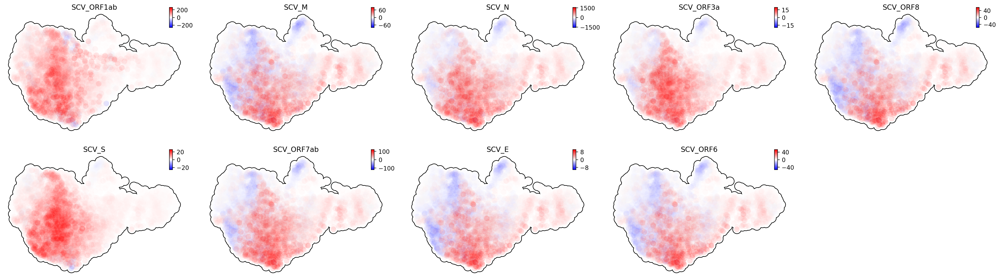

In [9]:
fig_kwargs = {'color': viral_genes, 'layer': 'velocity_gv', 'cmap': 'bwr', 'frontier': True,'sym_c': True, 'pointsize': 0.4,'ncols': 5, 'save_show_or_return': 'return'}
if save: save_kwargs = {'dpi': 300, 'fname': str(FIG_DIR)+'/figures_sars_cov_2/vgv_scatters.pdf', 'transparent': True}
ax = dyn.pl.scatters(adata, **fig_kwargs)
plt.savefig(**save_kwargs)
plt.show()

|-----------> plotting with basis key=X_umap


/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/plot/utils.py:642: RuntimeWarning: All-NaN slice encountered
  if np.nanmin(values) == 0:
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/plot/utils.py:642: RuntimeWarning: All-NaN slice encountered
  if np.nanmin(values) == 0:
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/plot/utils.py:642: RuntimeWarning: All-NaN slice encountered
  if np.nanmin(values) == 0:
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/opt/anaconda3/envs/gv-reprod/lib/

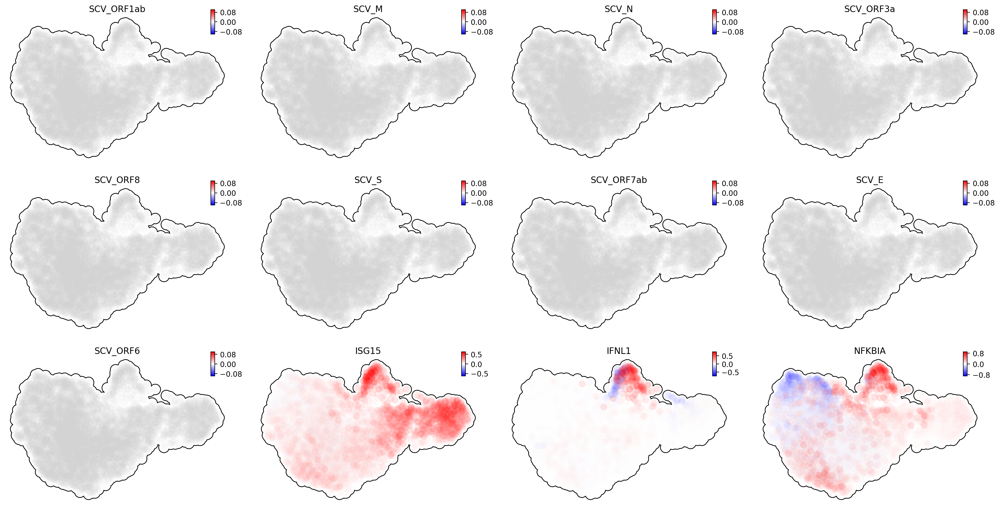

In [39]:
fig_kwargs = {'color': selected_genes, 'layer': 'velocity_S', 'cmap': 'bwr', 'frontier': True,'sym_c': True, 'pointsize': 0.4,'ncols': 4, 'save_show_or_return': 'return'}
if save: save_kwargs = {'dpi': 300, 'fname': str(FIG_DIR)+'/figures_sars_cov_2/dyn_scatters.pdf', 'transparent': True}
ax = dyn.pl.scatters(adata, **fig_kwargs)
plt.savefig(**save_kwargs)
plt.show()

In [27]:
adata.obs['virus_velo'] = dyn.tl.score_cells(adata, genes=viral_genes, layer='velocity_gv')
adata.obs['virus_speed'] = np.linalg.norm(adata[:, viral_genes].layers['velocity_gv'].A, axis=1)
# adata.obs['host_velo'] = dyn.tl.score_cells(adata, genes=host_genes, layer='velocity_gv')

|-----> method arg is None, choosing methods automatically...
|-----------> method pynn selected


|-----------> plotting with basis key=X_umap


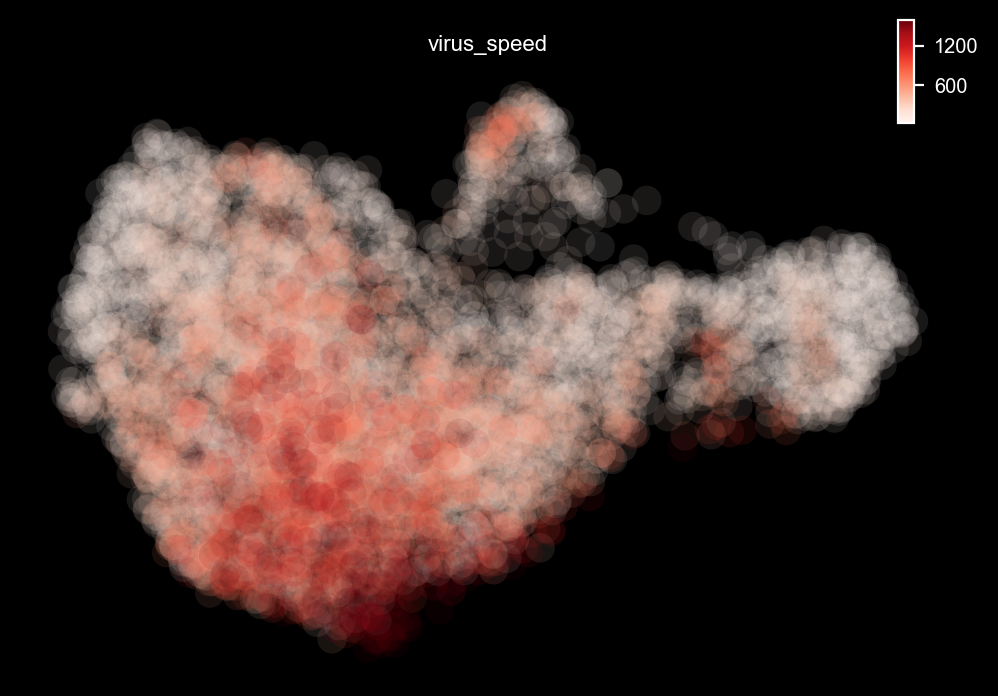

In [36]:
dyn.configuration.set_figure_params('dynamo', background='black')
fig_kwargs = {'color': ['virus_speed'], 'cmap': 'Reds', 'frontier': False, 'pointsize': 0.5, 'save_show_or_return': 'return'}
if save: save_kwargs = {'dpi': 300, 'fname': str(FIG_DIR)+'/figures_sars_cov_2/virus_speed_pre.pdf'}
ax = dyn.pl.scatters(adata, **fig_kwargs)
plt.savefig(**save_kwargs)
plt.show()

In [34]:
mack_score(adata, ekey='M_s', vkey='velocity_gv', tkey='viral_load', n_jobs=4)

calculating manifold-consistent scores in 4 cpu(s): 100%|██████████| 1000/1000 [00:08<00:00, 116.96it/s]


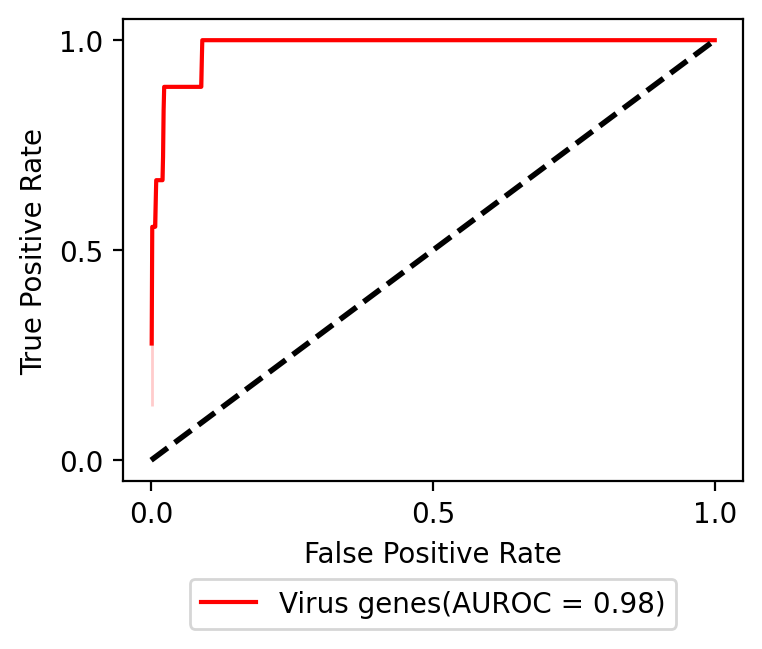

In [35]:
if save: save_kwargs = {'dpi': 300, 'fname': str(FIG_DIR)+'/figures_sars_cov_2/viral_gene_prediction.pdf'}
sort_val = adata.var['mack_score'].sort_values(ascending=False)
is_virg = sort_val.index.isin(viral_genes)
tpr_vir = [] 
fpr_vir = []
for cutoff in range(1, len(sort_val) + 1):
    tp_vir = np.sum(is_virg[:cutoff])
    fp_vir = cutoff - tp_vir
    tpr_vir.append(tp_vir / len(viral_genes))
    fpr_vir.append(fp_vir / (len(sort_val)-len(viral_genes)))
auroc_vir = np.trapz(tpr_vir, fpr_vir)
plt.figure(figsize=(4, 3))
sns.lineplot(x=fpr_vir, y=tpr_vir, label=f'Virus genes(AUROC = {auroc_vir:.2f})', color='red')
plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.xticks([0, 0.5, 1.0])
plt.yticks([0, 0.5, 1.0])
plt.grid(False)
plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.35), ncol=1, prop={'size': 10})
plt.savefig(**save_kwargs)
plt.show()

In [37]:
adata.obsm['velocity_umap'] = adata.obsm['gv_umap'].copy()
dyn.vf.VectorField(adata, basis='umap', M=800)

|-----> VectorField reconstruction begins...
|-----> Retrieve X and V based on basis: UMAP. 
        Vector field will be learned in the UMAP space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> [SparseVFC] completed [19.0833s]
|-----> [VectorField] completed [19.2696s]


/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:178: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:178: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----------> plotting with basis key=X_umap


/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/plot/topography.py:552: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'vmin' will be ignored
  ax.scatter(
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/plot/topography.py:552: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker (<matplotlib.markers.MarkerStyle object at 0x33014e220>).  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/plot/topography.py:552: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker (<matplotlib.markers.MarkerStyle object at 0x331132220>).  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/plot/topography.py:552: UserWarning: You

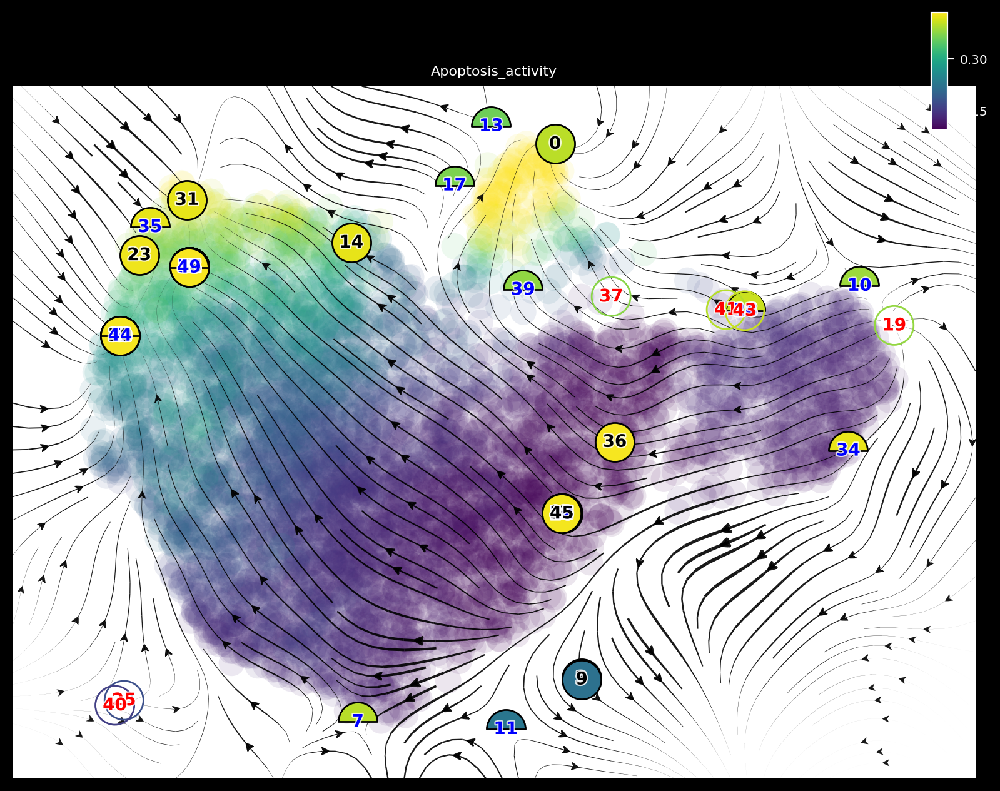

In [41]:
dyn.vf.topography(adata, n=250, basis="umap")
dyn.pl.topography(
    adata,
    markersize=500,
    color='Apoptosis_activity',
    basis="umap",
    fps_basis="umap",
    streamline_alpha=0.9,
    figsize=(8,6)
)

In [42]:
Xss, ftype = adata.uns["VecFld_umap"]["Xss"], adata.uns["VecFld_umap"]["ftype"]
good_fixed_points = [19, 0, 7, 31]  # n=500

adata.uns["VecFld_umap"]["Xss"] = Xss[good_fixed_points]
adata.uns["VecFld_umap"]["ftype"] = ftype[good_fixed_points]

|-----------> plotting with basis key=X_umap


/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/plot/topography.py:552: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker (<matplotlib.markers.MarkerStyle object at 0x332d042e0>).  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(
/opt/anaconda3/envs/gv-reprod/lib/python3.8/site-packages/dynamo/plot/topography.py:552: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'vmin' will be ignored
  ax.scatter(


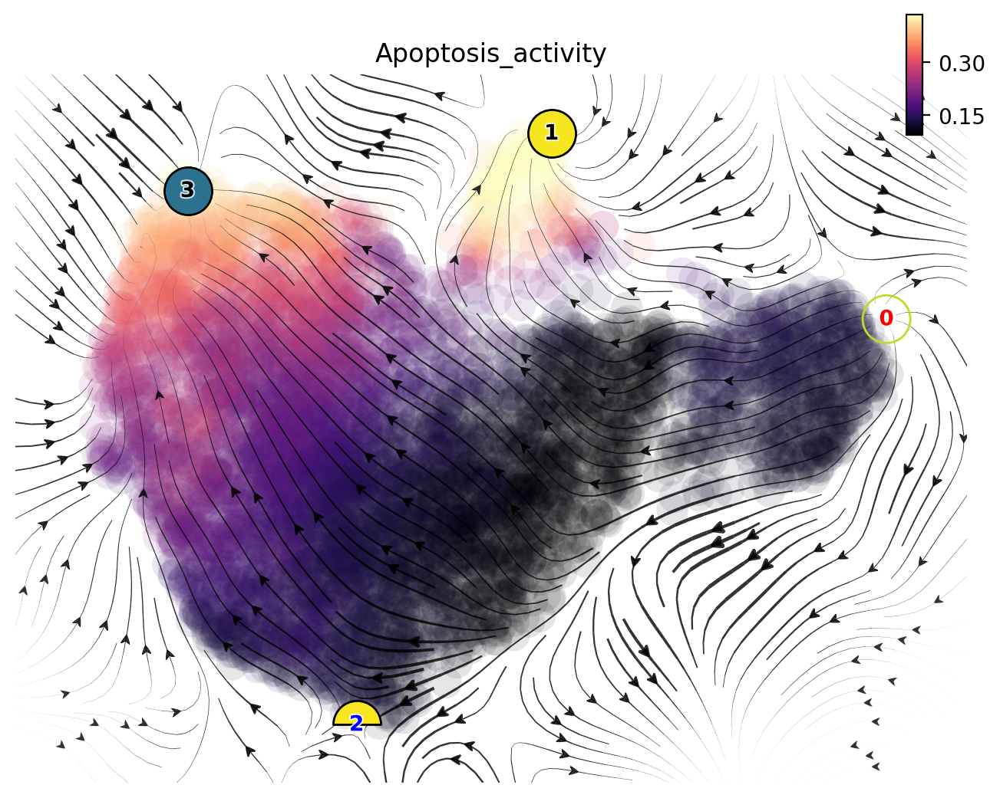

In [45]:
# dyn.pl.streamline_plot(adata, color='log_viral_load', method='SparseVFC', background='black')
dyn.configuration.reset_rcParams()
if save: save_kwargs = {'dpi': 300, 'fname': str(FIG_DIR)+'/figures_sars_cov_2/infected_topology.svg'}
ax = dyn.pl.topography(
    adata,
    markersize=500,
    color='Apoptosis_activity',
    basis="umap",
    fps_basis="umap",
    cmap='magma',
    streamline_alpha=0.8,
    figsize=(8,6),
    save_show_or_return="return",
)
plt.savefig(**save_kwargs)
plt.show()